## 1. 了解数据集

读取图片和对应的描述，Flickr8k数据集。

8千左右张图像，每张图像包含5条描述

下载连接：https://www.kaggle.com/adityajn105/flickr8k

In [48]:
data_location =  "/media/liuzh/data/DLData/Flickr8k/archive"
!ls $data_location

captions.txt  Images


In [49]:
# reading the txt data
import pandas as pd
caption_file = data_location + "/captions.txt"
df = pd.read_csv(caption_file)
print("There are {} images to captions".format(len(df)))

df.head(7)

There are 40455 images to captions


,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
5,1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting
6,1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with...


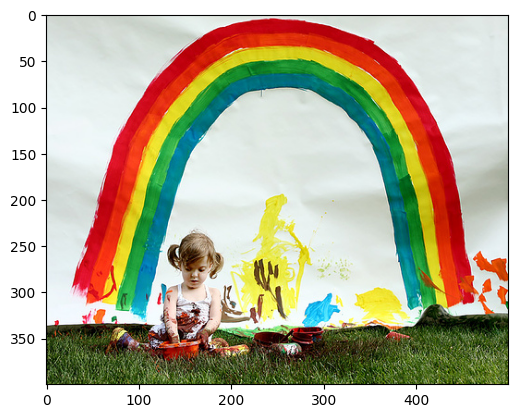

Caption: A little girl covered in paint sits in front of a painted rainbow with her hands in a bowl .
Caption: A little girl is sitting in front of a large painted rainbow .
Caption: A small girl in the grass plays with fingerpaints in front of a white canvas with a rainbow on it .
Caption: There is a girl with pigtails sitting in front of a rainbow painting .
Caption: Young girl with pigtails painting outside in the grass .


In [50]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# sigle image has 5 captions
# so, select index as : 0, 5, 10, 15, ...
data_idx = 10

image_path = data_location + "/Images/" + df.iloc[data_idx, 0]
img = mpimg.imread(image_path)
plt.imshow(img)
plt.show()

# Image contains of 5 captions
# showing all 5 captions of the image of the given idx
for i in range(data_idx, data_idx+5):
    print("Caption:", df.iloc[i, 1])


## 实现自定义的数据集

需要实现以下几个部分

- caption word tokenized to unique numbers
- vocab instace created to store all the relivent words in the datasets
- each batch, caption padded to have same sequence length
- image resized to the desired size and converted into captions

In [51]:
import os
from collections import Counter
import spacy
import torch
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as T

from PIL import Image

In [52]:
# using spacy for the better txt tokenization
spacy_eng = spacy.load("en_core_web_sm")
# spacy_eng = spacy.load("en_core_web_sm")

# example
txt = "This is a good place to find a city"
txt = "I'm going to New York City."   # 相比于split函数，调包可以将i'm 分解为i和'm两个部分，而split不可以。并且spacy可以把city.分解为city和. 但是split不可以。
[token.text.lower() for token in spacy_eng.tokenizer(txt)]

['i', "'m", 'going', 'to', 'new', 'york', 'city', '.']

In [6]:
class Vocabulary:
    def __init__(self, freq_threshold):
        # setting the pre-reserved(预先预订) tokens int to string tokens
        self.itos = {0:"<PAD>", 1:"<SOS>", 2:"<EOS>", 3:"<UNK>"} # PAD：填充， SOS：用于指示模型生成新句子，EOS：表示句子的结束，UNK：代表词汇表中未包含的单词

        # string to int tokens
        # its reverse dict self.itos
        self.stoi = {v:k for k, v in self.itos.items()}

        self.freq_threshold = freq_threshold

    def __len__(self):
        return len(self.itos)
    
    @staticmethod
    def tokenize(text):
        return [token.text.lower() for token in spacy_eng.tokenizer(text)]
    
    def build_vocab(self, sentence_list):
        frequencies = Counter()
        idx = 4

        for sentence in sentence_list:
            for word in self.tokenize(sentence):
                frequencies[word] += 1

                # add the word to the vocab if reaches minum frequecy threshold
                if frequencies[word] == self.freq_threshold: # 这里太妙了，使用等号而不是大于。因为如果是大于的话，还需要去重。
                    self.itos[idx] = word
                    self.stoi[word] = idx
                    idx += 1

    def numericalize(self, text):
        """
        For each word in the text corresponding index token for that word from the vocab built as list
        """
        tokenized_text = self.tokenize(text)
        return [self.stoi[token] if token in self.stoi else self.stoi["<UNK>"] for token in tokenized_text]



In [7]:
# testing the vicab class
v = Vocabulary(freq_threshold=1)

v.build_vocab(["This is a good place to find a city"])
print(v.stoi)
print(v.numericalize("This is a good place to find a city here!!"))

{'<PAD>': 0, '<SOS>': 1, '<EOS>': 2, '<UNK>': 3, 'this': 4, 'is': 5, 'a': 6, 'good': 7, 'place': 8, 'to': 9, 'find': 10, 'city': 11}
[4, 5, 6, 7, 8, 9, 10, 6, 11, 3, 3, 3]


In [8]:
class FlickrDataset(Dataset):
    """
    FlickrDataset   
    """
    def __init__(self, root_dir, captions_file, transform=None, freq_threshold=5):
        self.root_dir = root_dir
        self.df = pd.read_csv(captions_file)
        self.transform = transform

        # Get image and caption colum from the dataframe
        self.imgs = self.df["image"]
        self.captions = self.df["caption"]

        # Initialize vocabulary and build vocab
        self.vocab = Vocabulary(freq_threshold)
        self.vocab.build_vocab(self.captions.tolist()) #这里tolist好呀，就把series对象变成了list了

    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, index):
        caption = self.captions[index]
        img_name = self.imgs[index]
        img_location = os.path.join(self.root_dir, img_name)
        img = Image.open(img_location).convert("RGB")

        #apply the transformation to the image
        if self.transform is not None:
            img = self.transform(img)

        # numericalize the caption text
        caption_vec = []
        caption_vec += [self.vocab.stoi["<SOS>"]]
        caption_vec += self.vocab.numericalize(caption)
        caption_vec += [self.vocab.stoi["<EOS>"]]

        return img, torch.tensor(caption_vec)

In [9]:
#defing the transform to be applied
transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor()
])

In [10]:
def show_image(inp, title=None):
    """Imshow for Tensor"""
    inp = inp.numpy().transpose((1, 2, 0))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) # pause a bit so that plots are updated

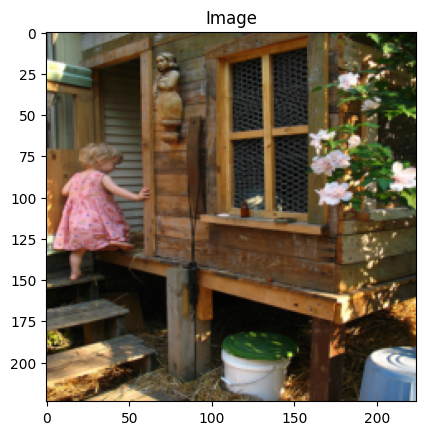

Token tensor([  1,   4,  28,   8,   4, 195, 151,  17,  32,  67,   4, 353,  11, 711,
          8,  24,   3, 496,   5,   2])
Setence:
['<SOS>', 'a', 'child', 'in', 'a', 'pink', 'dress', 'is', 'climbing', 'up', 'a', 'set', 'of', 'stairs', 'in', 'an', '<UNK>', 'way', '.', '<EOS>']


In [11]:
dataset = FlickrDataset(
    root_dir= data_location +"/Images",
    captions_file= data_location +"/captions.txt",
    transform=transforms
)

img, caps = dataset[0]
show_image(img, "Image")
print("Token", caps)
print("Setence:")
print([dataset.vocab.itos[token] for token in caps.tolist()])

In [12]:
class CapsCollate:
    """
    Collate to apply the padding to the captions with dataloader
    为了batch的时候，所有数据都是一样大的，需要用Collate
    """
    def __init__(self, pad_idx, batch_first=False):
        self.pad_idx = pad_idx
        self.batch_first = batch_first

    def __call__(self, batch):
        # batch: list of tuples (img, caption)
        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs, dim=0)  # 这样就把batch的维度给添加上来了

        targets = [item[1] for item in batch]
        targets = pad_sequence(targets, batch_first=self.batch_first, padding_value=self.pad_idx)
        # pad_sequence 的输入是一个序列的列表[seq1, seq2, ...] seq是一个pytorch张量。  batch_first是一个布尔值，用于指定批次索引是否在第一个维度。

        return imgs, targets


In [13]:
# writing the dataloader
# setting the costants
BATCH_SIZE = 4
NUM_WORKER = 1

# token to represent the padding
pad_idx = dataset.vocab.stoi["<PAD>"]

data_loader = DataLoader(
    dataset=dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKER,
    shuffle=True,
    collate_fn=CapsCollate(pad_idx=pad_idx, batch_first=True)
)

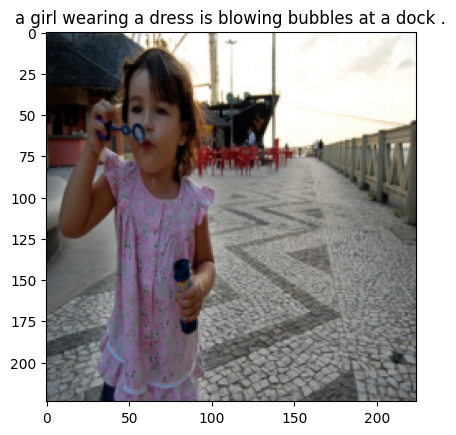

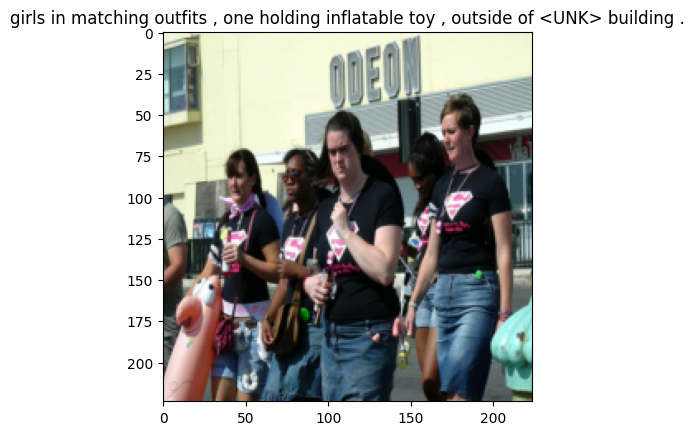

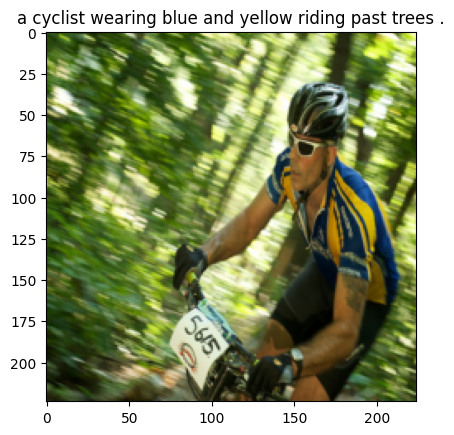

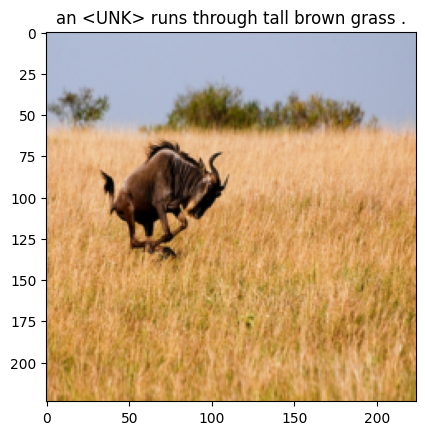

In [14]:
# generating the iterator from the dataloader
dataiter = iter(data_loader)

# getting the next batch
batch = next(dataiter)

# unpacking the batch
images, captions = batch

# showing info of image in single batch
for i in range(BATCH_SIZE):
    img, cap = images[i], captions[i]
    caption_label = [dataset.vocab.itos[token] for token in cap.tolist()]
    eos_index = caption_label.index("<EOS>")
    caption_label = caption_label[1:eos_index]
    caption_label = ' '.join(caption_label)
    show_image(img, caption_label)
    plt.show()

## 实现模型

Image Captioning with Attention - Pytorch

代码连接：https://www.kaggle.com/code/mdteach/torch-data-loader-flicker-8k

In [ ]:
# 更新show_image

def show_image(inp, title=None):
    """Imshow for Tensor"""

    # unnormalize
    inp[0] = inp[0] * 0.229
    inp[1] = inp[1] * 0.224
    inp[2] = inp[2] * 0.225
    inp[0] += 0.485
    inp[1] += 0.455
    inp[2] += 0.406

    inp = inp.numpy().transpose((1, 2, 0))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) # pause a bit so that plots are updated

In [16]:
BATCH_SIZE = 256
NUM_WORKER = 4

# defining the transform to be applied
transforms = T.Compose([
    T.Resize(226),
    T.RandomCrop(224),
    T.ToTensor(),
    T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

# T.Normalize 中第一个元组是每个通道的均值（mean），分别对应 RGB 通道。第二个元组 (0.229, 0.224, 0.225) 是每个通道的标准差（std），也分别对应 RGB 通道。
# 这些数值是基于 ImageNet 数据集计算得到的全局均值和标准差

# testing the dataset class
dataset = FlickrDataset(
    root_dir= data_location + "/Images",
    captions_file= data_location + "/captions.txt",
    transform=transforms
)

# wirting the dataloader
data_loader = DataLoader(
    dataset=dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKER,
    shuffle=True,
    collate_fn=CapsCollate(pad_idx=pad_idx, batch_first=True)
)

#vocab_size = len(dataset.vocab)

device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=1)

### 定义模型

Model is seq2seq model. In the `encoder` pretrained ResNet model is used to extract the features. 

`decoder` is the implementation of the Bahdanau Attention Decoder. In the decoder model LSTM cell

In [17]:
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision.models as models
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

In [ ]:
class EncoderCNN(nn.Module):
    def __init__(self):
        super().__init__()
        resnet = models.resnet50(pretrained=True)
        for param in resnet.parameters():  # 这就是把resnet给锁住了，不更新
            param.requires_grad_(False)

        modules = list(resnet.children())[:-2]  # 后面两个是average pool和fc
        self.resnet = nn.Sequential(*modules)

    def forward(self, images):
        features = self.resnet(images)  # (batch_size, 2048, 7, 7)
        features = features.permute(0, 2, 3, 1) # (batch_size, 7, 7, 2048)
        features = features.view(features.size(0), -1, features.size(-1)) # (batch_size, 49, 2048)  # reshape as (batch_size, num_features, feature_dim)

        return features

        

In [ ]:
# Bahdanau Attention
class Attention(nn.Module):
    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super().__init__()

        self.attention_dim = attention_dim 

        self.W = nn.Linear(decoder_dim, attention_dim)
        self.U = nn.Linear(encoder_dim, attention_dim)

        self.A = nn.Linear(attention_dim, 1)

    
    def forward(self, features, hidden_state):
        """
        query是上一个decoder输出的embed，key和value都是encoder输出的feature
        """
        u_hs = self.U(features) # (batch_size, num_layers, attention_dim)
        w_ah = self.W(hidden_state) # (batch_size, attention_dim)

        combined_states = torch.tanh(u_hs + w_ah.unsqueeze(1)) # (batch_size, num_layers, attention_dim)
        attention_scores = self.A(combined_states) # (batch_size, num_layers, 1)
        attention_scores = attention_scores.squeeze(2) # (batch_size, num_layers)

        alpha = F.softmax(attention_scores, dim=1) # (batch_size, num_layers)

        # 下面这两行就是加权求和了。出了这样写，也可以写成bmm的方式，就是batch矩阵相乘的方法。
        attention_weights = features * alpha.unsqueeze(2) # (batch_size, num_layers, features_dim)
        attention_weights = attention_weights.sum(dim=1) # (batch_size, features_dim)

        return alpha, attention_weights

In [ ]:
# Attention Decoder
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, vocab_size, attention_dim, encoder_dim, decoder_dim, drop_prob=0.3):
        super().__init__()

        # save the model param
        self.vocab_size = vocab_size
        self.attention_dim = attention_dim
        self.decoder_dim = decoder_dim

        self.embedding = nn.Embedding(vocab_size, embed_size)
        self.attention = Attention(encoder_dim, decoder_dim, attention_dim)


        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        self.init_c = nn.Linear(encoder_dim, decoder_dim)
        self.lstm_cell = nn.LSTMCell(embed_size+encoder_dim, decoder_dim, bias=True)
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)

        self.fcn = nn.Linear(decoder_dim, vocab_size)
        self.drop = nn.Dropout(drop_prob)

    def forward(self, features, captions):
        # features: [batch, num_features, feature_dim]

        # vectorize the caption
        embeds = self.embedding(captions) # embed：(batch, num_words, embed_dim)

        # Initialize LSTM state
        h, c = self.init_hidden_state(features)

        # get the seq length to iterate
        seq_length = len(captions[0]) - 1 # Exclude the last one
        batch_size = captions.size(0)
        num_features = features.size(1)

        preds = torch.zeros(batch_size, seq_length, self.vocab_size).to(device)
        alphas = torch.zeros(batch_size, seq_length, num_features).to(device)

        for s in range(seq_length):
            alpha, context = self.attention(features, h)
            lstm_input = torch.cat((embeds[:, s], context), dim=1)  # 所以lstm的input是embed_size + encoder_dim
            h, c = self.lstm_cell(lstm_input, (h, c))

            output = self.fcn(self.drop(h)) # output: 是一个向量，长度为从vocab_size

            preds[:,s] = output
            alphas[:,s] = alpha

        return preds, alphas
    

    def generate_caption(self, features, max_len=20, vocab=None):
        # Inference part
        # Given the image features generate the captions

        batch_size = features.size(0)
        h, c = self.init_hidden_state(features) # (batch_size, decoder_dim)

        alphas = []

        # starting input
        word = torch.tensor(vocab.stoi["<SOS>"]).view(1, -1).to(device)  #word: [1, 1]
        embeds = self.embedding(word) #embeds: [1, 1, embed_dim]

        captions = []

        for i in range(max_len):
            alpha, context = self.attention(features, h)

            # store the alpha score
            alphas.append(alpha.cpu().detach().numpy())

            lstm_input = torch.cat((embeds[:, 0], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))
            output = self.fcn(self.drop(h))  # output: [batch, 1, vocab_size]
            output = output.view(batch_size, -1)

            #select the word with most val
            predicted_word_idx = output.argmax(dim=-1)

            #save the generated word
            captions.append(predicted_word_idx.item())

            # end if <EOS> detected
            if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                break

            #send generated word as the next caption
            embeds = self.embedding(predicted_word_idx.unsqueeze(0))

        #covert the vocab idx to words and return sentence
        return [vocab.itos[idx] for idx in captions], alphas




    def init_hidden_state(self, encoder_out):
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out) # (batch_size, decoder_dim)
        c = self.init_c(mean_encoder_out)
        return h, c

In [21]:
class EncoderDecoder(nn.Module):
    def __init__(self, embed_size, vocab_size, attention_dim, encoder_dim, decoder_dim, drop_prob=0.3):
        super().__init__()
        self.encoder = EncoderCNN()
        self.decoder = DecoderRNN(
            embed_size=embed_size,
            vocab_size=len(dataset.vocab),
            attention_dim=attention_dim,
            encoder_dim=encoder_dim,
            decoder_dim=decoder_dim
        )

    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        return outputs

In [22]:
# Hyperparams
embed_size = 300
vocab_size = len(dataset.vocab)
attention_dim = 256
encoder_dim = 2048
decoder_dim = 512
learning_rate = 3e-4

In [23]:
# init model
model = EncoderDecoder(
    embed_size=embed_size,
    vocab_size=vocab_size,
    attention_dim=attention_dim,
    encoder_dim=encoder_dim,
    decoder_dim=decoder_dim
).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

/home/liuzh/anaconda3/envs/DL/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/liuzh/anaconda3/envs/DL/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [24]:
# helper funcion to save the model

def save_model(model, num_epochs):
    model_state = {
        'num_epochs':num_epochs,
        'embed_size':embed_size,
        'vocab_size':len(dataset.vocab),
        'attention_dim':attention_dim,
        'encoder_dim':encoder_dim,
        'decoder_dim':decoder_dim,
        'state_dict':model.state_dict()
    }

    torch.save(model_state, 'attention_model_state.pth')

### Training

Epoch: 1 loss: 4.31239


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.015686303..1.08956].


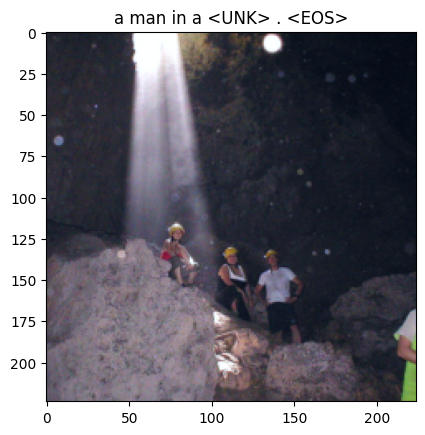

Epoch: 2 loss: 3.64868


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.08956].


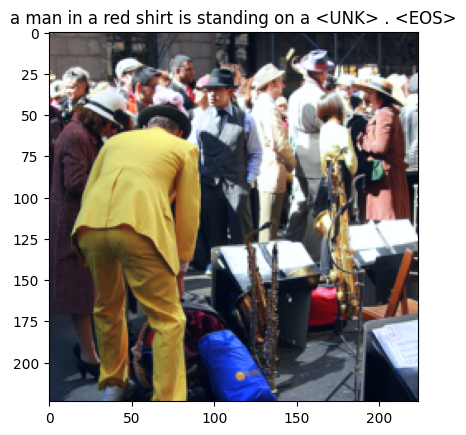

Epoch: 3 loss: 3.29111


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.08956].


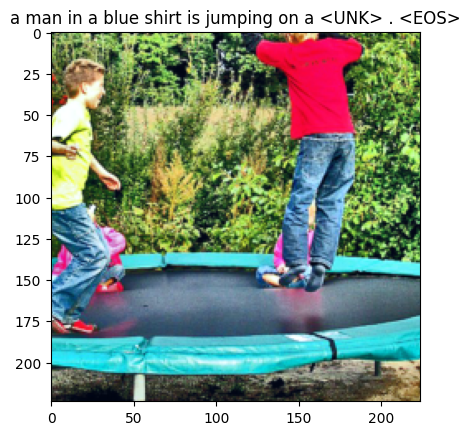

Epoch: 4 loss: 3.15209


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.08956].


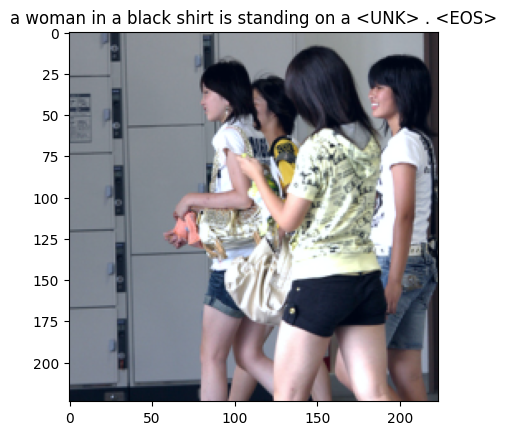

Epoch: 5 loss: 2.91660


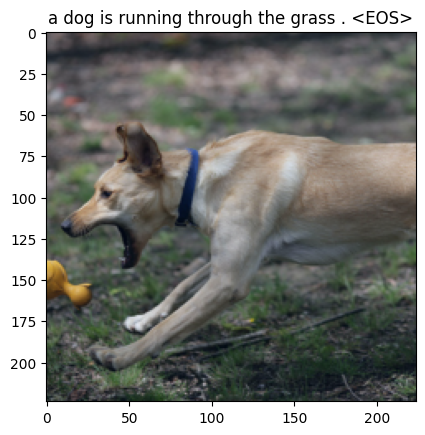

Epoch: 6 loss: 2.93003


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0855688].


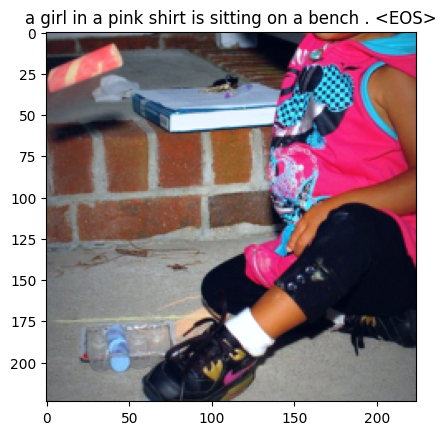

Epoch: 7 loss: 2.74407


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.007843137..1.08956].


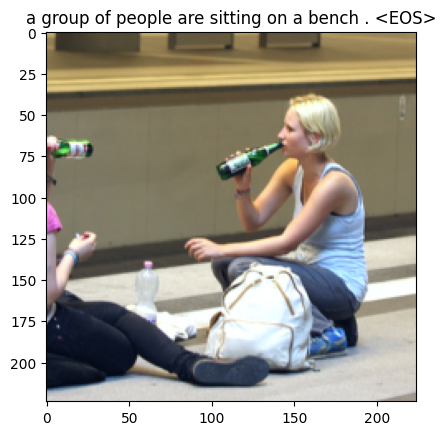

Epoch: 8 loss: 2.73109


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.08956].


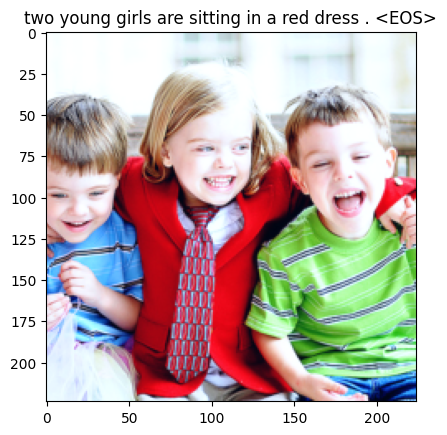

Epoch: 9 loss: 2.66330


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0855688].


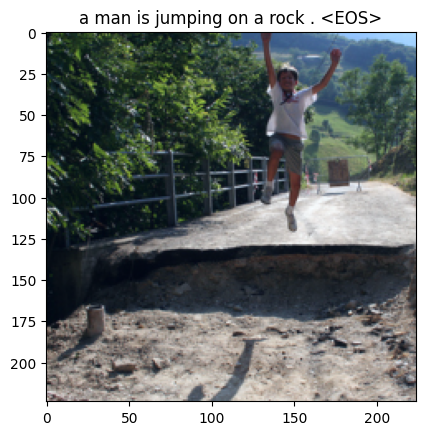

Epoch: 10 loss: 2.58680


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.08956].


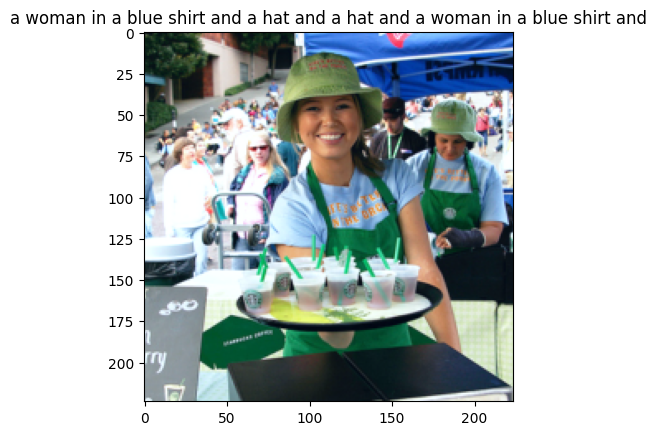

Epoch: 11 loss: 2.47836


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.007843137..1.08956].


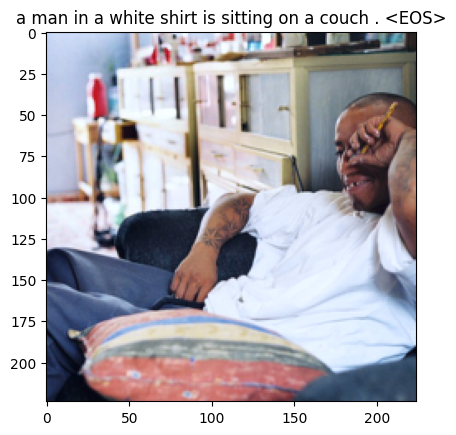

Epoch: 12 loss: 2.54684


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.011764705..1.08956].


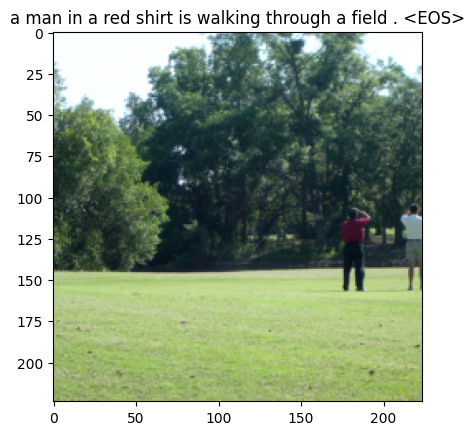

Epoch: 13 loss: 2.46275


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.007843137..1.08956].


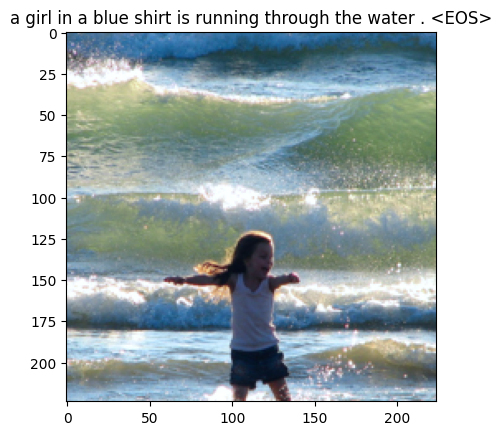

Epoch: 14 loss: 2.41279


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0775862].


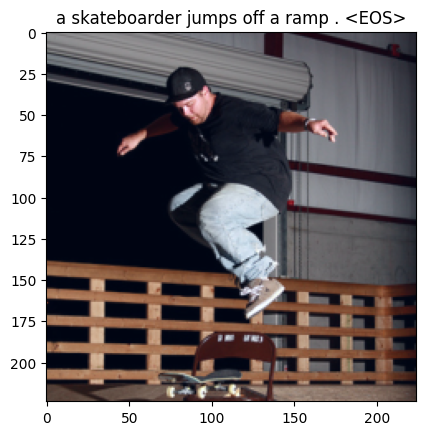

Epoch: 15 loss: 2.39998


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0039215386..1.0656123].


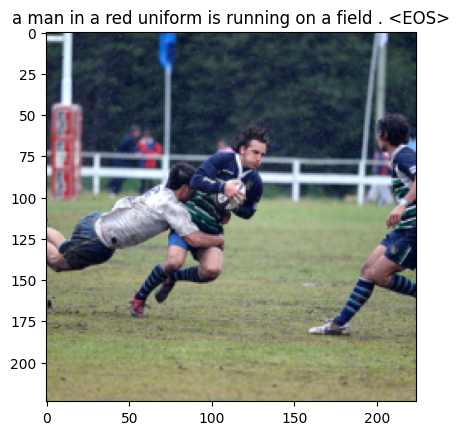

Epoch: 16 loss: 2.26151


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0039215386..1.0855688].


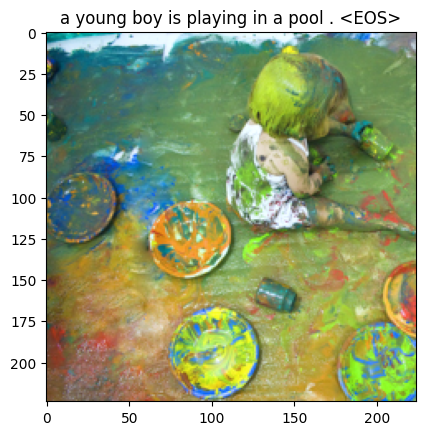

Epoch: 17 loss: 2.30964


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0039215386..1.08956].


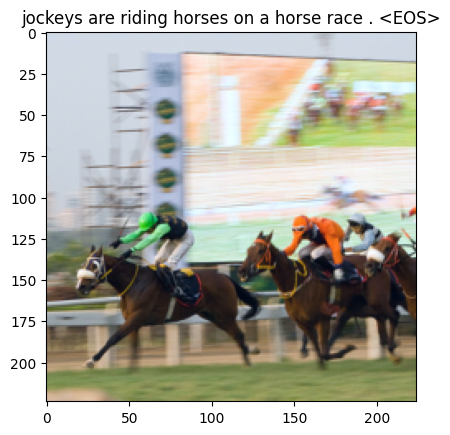

Epoch: 18 loss: 2.25789


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04705882..1.0735948].


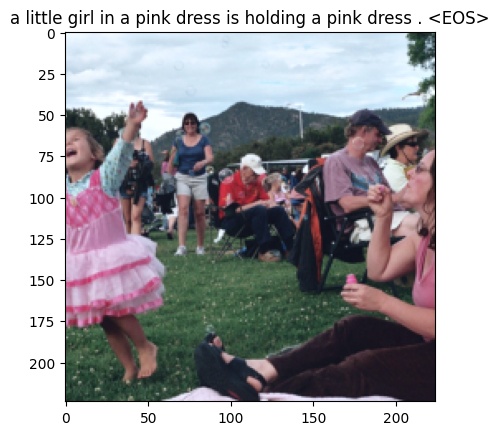

Epoch: 19 loss: 2.29688


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.007843137..1.08956].


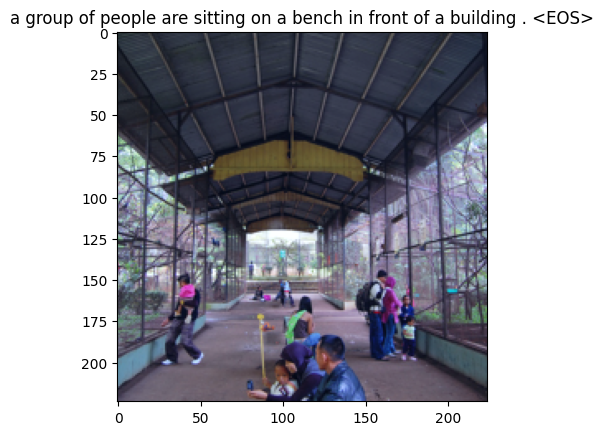

Epoch: 20 loss: 2.26264


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.14310366..1.0177169].


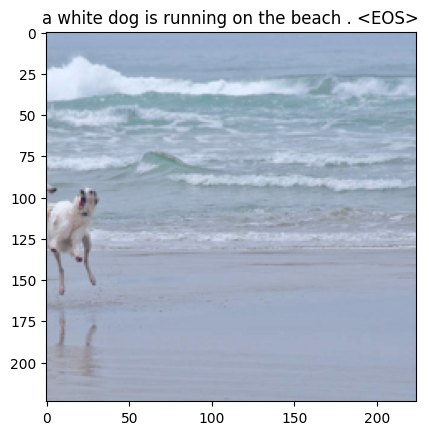

Epoch: 21 loss: 2.16043


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.08956].


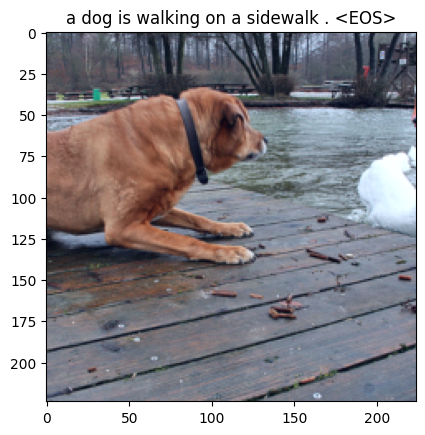

Epoch: 22 loss: 2.07401


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.007843137..1.08956].


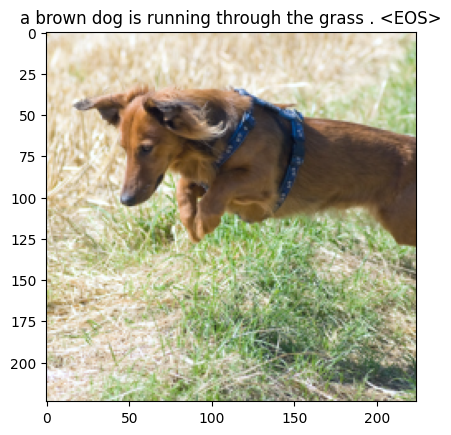

Epoch: 23 loss: 2.16751


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.007843137..1.08956].


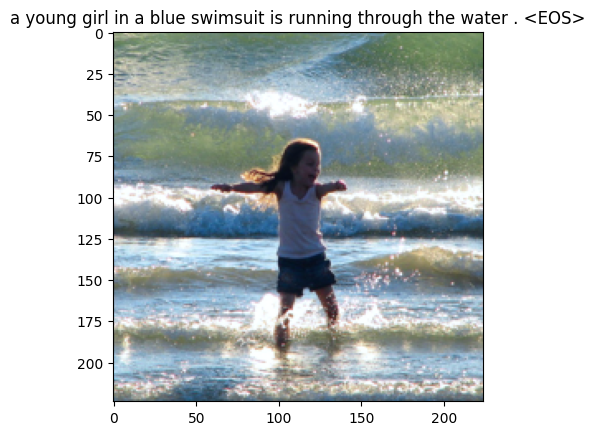

Epoch: 24 loss: 2.07292


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0039215386..1.0855688].


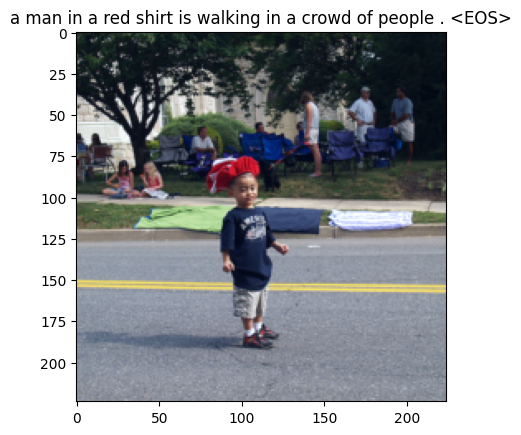

Epoch: 25 loss: 2.05660


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0815775].


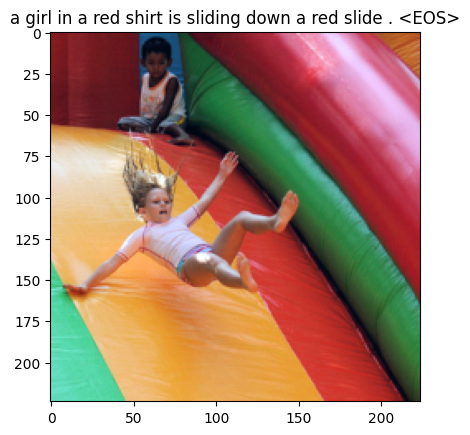

In [25]:
num_epochs = 25
print_every=100

for epoch in range(1, num_epochs+1):
    for idx, (image, captions) in enumerate(iter(data_loader)):
        image, captions = image.to(device), captions.to(device)

        # Zero the gradients
        optimizer.zero_grad()

        # Feed forward
        outputs, attentions = model(image, captions)

        # calculate the batch loss
        targets = captions[:, 1:]
        loss = criterion(outputs.view(-1, vocab_size), targets.reshape(-1))

        # Backward pass
        loss.backward()

        # Update the parameters in the optimizer
        optimizer.step()

        if (idx+1) % print_every == 0:
            print("Epoch: {} loss: {:.5f}".format(epoch, loss.item()))

            # generate the caption
            model.eval()
            with torch.no_grad():
                dataiter = iter(data_loader)
                img, _ = next(dataiter)
                features = model.encoder(img[0:1].to(device))  # (1, 49, 2048)
                caps, alphas = model.decoder.generate_caption(features, vocab=dataset.vocab)
                caption = ' '.join(caps)
                show_image(img[0], title=caption)

            model.train()

    save_model(model, epoch)

## 可视化attention

In [ ]:
# generate caption
def get_caps_from(features_tensors):
    #generate the caption
    model.eval()
    with torch.no_grad():
        features = model.encoder(features_tensors.to(device))
        caps, alphas = model.decoder.generate_caption(features, vocab=dataset.vocab)
        caption = ' '.join(caps)
        show_image(features_tensors[0], title=caption)

    return caps, alphas



#Show attention
def plot_attention(img, result, attention_plot):
    #untransform
    img[0] = img[0] * 0.229
    img[1] = img[1] * 0.224
    img[2] = img[2] * 0.225
    img[0] += 0.485
    img[1] += 0.455
    img[2] += 0.406

    img = img.numpy().transpose((1, 2, 0))
    temp_image = img

    fig = plt.figure(figsize=(15, 15))
    len_result = len(result)
    for l in range(len_result):
        temp_att = attention_plot[l].reshape(7, 7)  # attention_plot: [batch_size, num_steps] num_steps is 49 response to the (7 * 7)

        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap="gray", alpha=0.7, extent=img.get_extent())  # extent用于确保注意力图与原始图像的尺寸和范围匹配。

    plt.tight_layout()
    plt.show()



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0009999573..0.9607843].


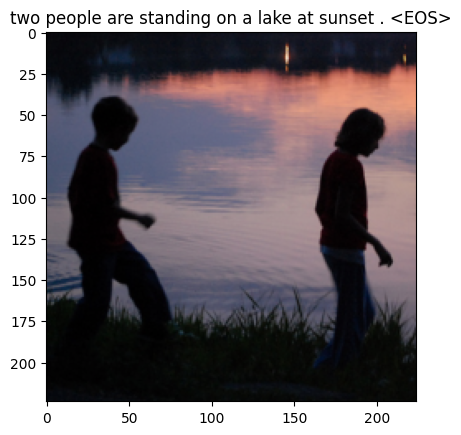

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0009999573..0.9607843].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0009999573..0.9607843].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0009999573..0.9607843].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0009999573..0.9607843].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0009999573..0.9607843].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0009999573..0.9607843].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Go

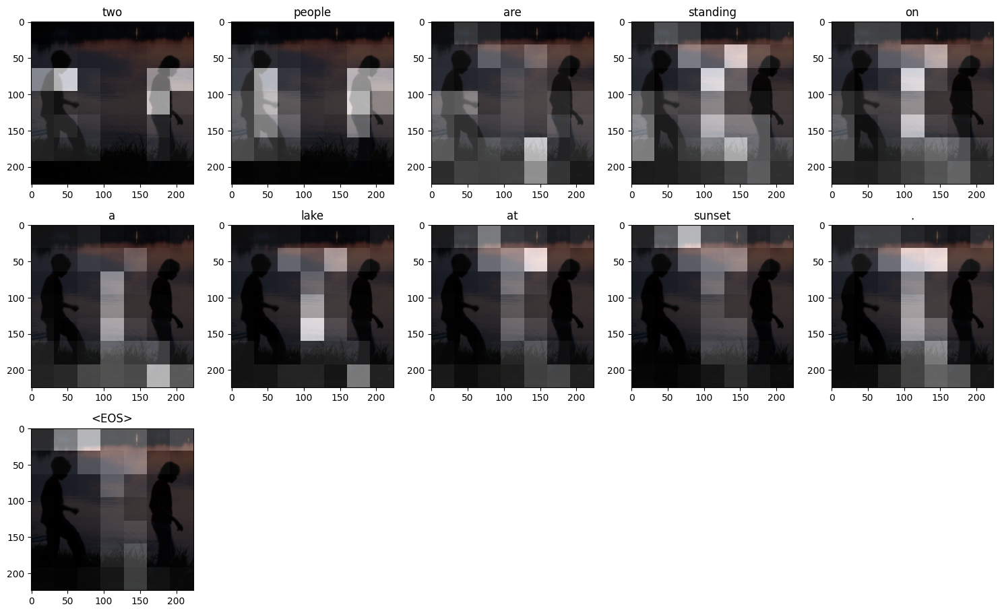

In [42]:
# show any1
dataiter = iter(data_loader)
images, _ = next(dataiter)

img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps, alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)

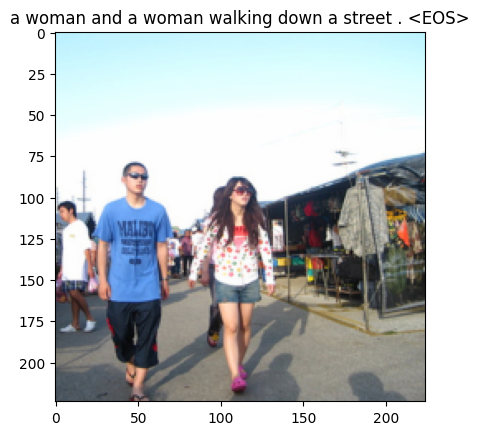

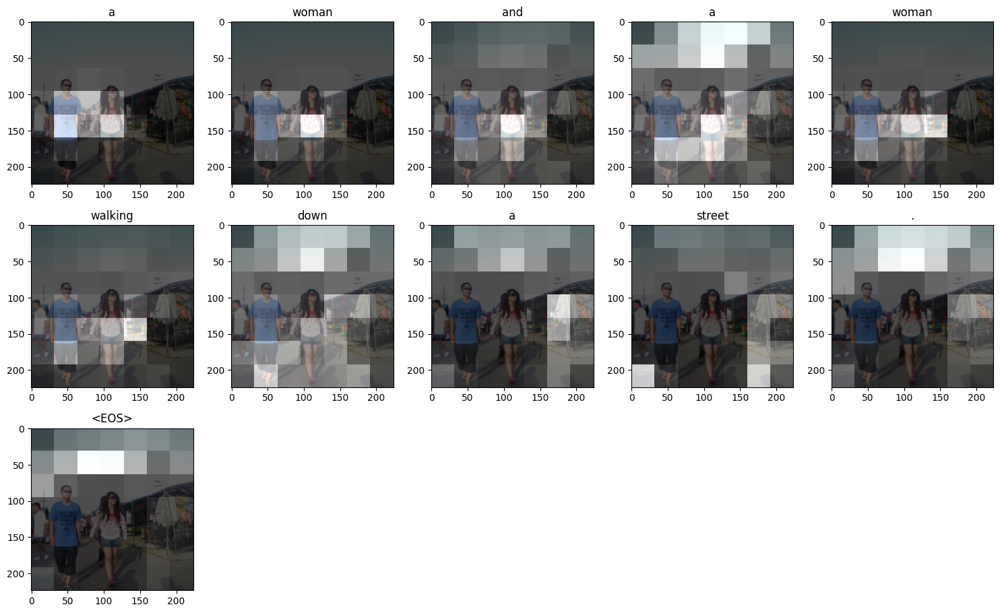

In [46]:
# show any1
dataiter = iter(data_loader)
images, _ = next(dataiter)

img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps, alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0009999573..0.9990001].


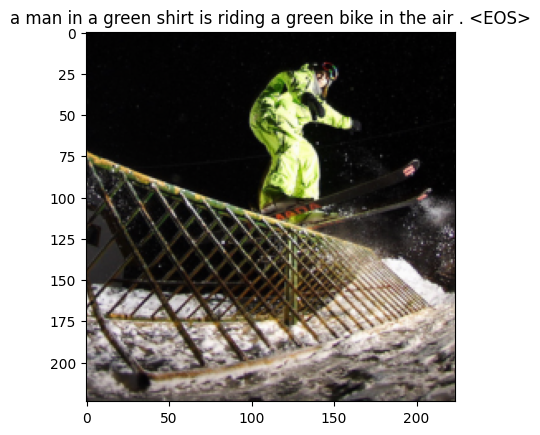

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0009999573..0.9990001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0009999573..0.9990001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0009999573..0.9990001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0009999573..0.9990001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0009999573..0.9990001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0009999573..0.9990001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Go

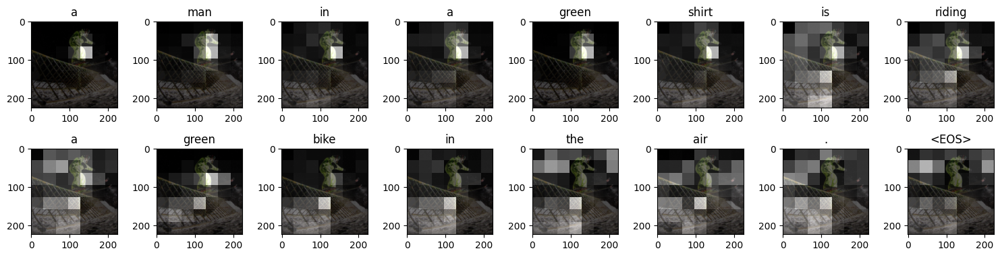

In [47]:
# show any1
dataiter = iter(data_loader)
images, _ = next(dataiter)

img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps, alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)